# Location Data Feature Engineering 

This workflow integrates crash data with weather, geographic, and temporal information. 

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.types import DoubleType, BooleanType
from shapely.geometry import shape
import geopandas as gpd
import json
import os
import re

from pyspark.sql.functions import col, format_string,length, expr, when, array, struct, udf, explode, split, array_intersect, size, lit, year, month, sum, count, collect_set,  radians, sin, cos, asin, sqrt, lit
from pyspark.sql.types import ArrayType, StructType, StructField, StringType
from functools import partial
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec
import numpy as np
from pyspark.sql import functions as F
from pyspark.sql.window import Window

In [0]:
spark = SparkSession.builder.appName("Location Feature Engineering").getOrCreate()

## State Crash Data

In [0]:
# Read in data "/FileStore/intermediate_output/aggregated_site_radius_crash_df.csv"
aggregated_site_radius_crash_df = spark.read.csv("/FileStore/intermediate_output/aggregated_site_radius_crash_df.csv", header=True, inferSchema=True)

First, the code aggregates crash data by site ID, brand, year, and month, calculating sum totals for crashes, fatalities, injuries, and vehicles at each location. Then it defines a window specification that partitions the data by site ID and brand, which enables calculations across all months for each site-brand combination. Finally, it calculates summary statistics for each metric (crashes, fatalities, injuries, vehicles), including:

* Mean (average)
* Median (50th percentile)
* Minimum and maximum values
* Standard deviation (measure of data spread)
* Interquartile range (IQR: difference between 75th and 25th percentiles)

In [0]:
# First get the data aggregated by site, brand, year, and month
crash_site_summary_stats = aggregated_site_radius_crash_df.groupBy('ID','Brand', 'Crash Year', 'Crash Month').agg(
    F.sum('total_crashes').alias('total_crashes'),
    F.sum('total_fatalities').alias('total_fatalities'),
    F.sum('total_injuries').alias('total_injuries'),
    F.sum('total_vehicles').alias('total_vehicles')
)

# Define window specification for statistics by ID and Brand across months
window_spec = Window.partitionBy('ID', 'Brand')

# Calculate all statistics using PySpark functions
site_brand_stats = crash_site_summary_stats.select(
    'ID', 
    'Brand',
    # Statistics for total_crashes
    F.mean('total_crashes').over(window_spec).alias('total_crashes_mean'),
    F.expr('percentile_approx(total_crashes, 0.5)').over(window_spec).alias('total_crashes_median'),
    F.min('total_crashes').over(window_spec).alias('total_crashes_min'),
    F.max('total_crashes').over(window_spec).alias('total_crashes_max'),
    F.stddev('total_crashes').over(window_spec).alias('total_crashes_std'),
    (F.expr('percentile_approx(total_crashes, 0.75)').over(window_spec) - 
     F.expr('percentile_approx(total_crashes, 0.25)').over(window_spec)).alias('total_crashes_iqr'),
    
    # Statistics for total_fatalities
    F.mean('total_fatalities').over(window_spec).alias('total_fatalities_mean'),
    F.expr('percentile_approx(total_fatalities, 0.5)').over(window_spec).alias('total_fatalities_median'),
    F.min('total_fatalities').over(window_spec).alias('total_fatalities_min'),
    F.max('total_fatalities').over(window_spec).alias('total_fatalities_max'),
    F.stddev('total_fatalities').over(window_spec).alias('total_fatalities_std'),
    (F.expr('percentile_approx(total_fatalities, 0.75)').over(window_spec) - 
     F.expr('percentile_approx(total_fatalities, 0.25)').over(window_spec)).alias('total_fatalities_iqr'),
    
    # Statistics for total_injuries
    F.mean('total_injuries').over(window_spec).alias('total_injuries_mean'),
    F.expr('percentile_approx(total_injuries, 0.5)').over(window_spec).alias('total_injuries_median'),
    F.min('total_injuries').over(window_spec).alias('total_injuries_min'),
    F.max('total_injuries').over(window_spec).alias('total_injuries_max'),
    F.stddev('total_injuries').over(window_spec).alias('total_injuries_std'),
    (F.expr('percentile_approx(total_injuries, 0.75)').over(window_spec) - 
     F.expr('percentile_approx(total_injuries, 0.25)').over(window_spec)).alias('total_injuries_iqr'),
    
    # Statistics for total_vehicles
    F.mean('total_vehicles').over(window_spec).alias('total_vehicles_mean'),
    F.expr('percentile_approx(total_vehicles, 0.5)').over(window_spec).alias('total_vehicles_median'),
    F.min('total_vehicles').over(window_spec).alias('total_vehicles_min'),
    F.max('total_vehicles').over(window_spec).alias('total_vehicles_max'),
    F.stddev('total_vehicles').over(window_spec).alias('total_vehicles_std'),
    (F.expr('percentile_approx(total_vehicles, 0.75)').over(window_spec) - 
     F.expr('percentile_approx(total_vehicles, 0.25)').over(window_spec)).alias('total_vehicles_iqr')
).distinct()

# Display the results
display(site_brand_stats)

ID,Brand,total_crashes_mean,total_crashes_median,total_crashes_min,total_crashes_max,total_crashes_std,total_crashes_iqr,total_fatalities_mean,total_fatalities_median,total_fatalities_min,total_fatalities_max,total_fatalities_std,total_fatalities_iqr,total_injuries_mean,total_injuries_median,total_injuries_min,total_injuries_max,total_injuries_std,total_injuries_iqr,total_vehicles_mean,total_vehicles_median,total_vehicles_min,total_vehicles_max,total_vehicles_std,total_vehicles_iqr
42.0,Forza Site Services,309.28,310.0,180.0,371.0,40.92322079211264,51.0,10.04,10.0,5.0,18.0,3.142186075542525,3.0,154.0,157.0,79.0,217.0,28.902133715927153,30.0,627.0,630.0,383.0,782.0,82.61961026293939,93.0
41.0,FusionSite - Cedar Rapids,2301.0,2301.0,1267.0,2615.0,258.3197308246765,230.0,68.84,70.0,23.0,121.0,18.72093302518155,16.0,1214.12,1250.0,628.0,1467.0,175.99557759595365,220.0,4917.08,4858.0,2581.0,6712.0,738.4665372694058,427.0
31.0,Redi2Go,851.92,861.0,385.0,999.0,119.60940598464653,77.0,25.52,26.0,11.0,45.0,8.196137301599252,11.0,403.96,414.0,183.0,503.0,71.12868619621763,103.0,1777.2,1811.0,837.0,2081.0,249.17463755366435,173.0
34.0,Fusionsite Services,2144.28,2143.0,1051.0,2537.0,282.5813334245559,183.0,60.8,61.0,26.0,89.0,14.82115605027714,16.0,1053.6,1049.0,493.0,1246.0,158.92555909397748,142.0,4431.24,4444.0,2177.0,5155.0,585.5866915609791,484.0
28.0,A Clean Portoco,24.8,25.0,11.0,37.0,5.830951894845301,8.0,0.6,0.0,0.0,4.0,0.9999999999999998,1.0,14.92,15.0,8.0,24.0,5.024274408641841,9.0,50.48,48.0,21.0,76.0,12.5436570956533,15.0
16.0,Rent-A-John,2038.28,2072.0,897.0,2517.0,284.3280851410919,193.0,66.8,69.0,20.0,101.0,17.628102563804195,23.0,1038.12,1078.0,438.0,1396.0,164.5920006156638,138.0,4219.4,4337.0,1929.0,5260.0,570.2336509420209,416.0
26.0,A Sani-Can,1882.56,1874.0,753.0,2241.0,278.59514831860696,174.0,52.76,49.0,23.0,89.0,15.756691700142301,15.0,892.0,893.0,338.0,1135.0,154.13305939998725,90.0,3988.4,3993.0,1594.0,4882.0,607.4140542770914,364.0
27.0,Stranders Sanitary,1978.64,1990.0,903.0,2372.0,275.16054101802706,135.0,68.0,66.0,34.0,102.0,16.899211026948368,23.0,993.76,1005.0,392.0,1375.0,170.77355376833574,144.0,4059.12,4069.0,1786.0,4896.0,582.4523099218796,462.0
25.0,Bucky's Restrooms,1666.64,1681.0,777.0,2084.0,231.78705744713184,130.0,54.36,52.0,22.0,89.0,15.258549516036359,19.0,866.2,881.0,361.0,1105.0,137.66596045016598,135.0,3495.28,3479.0,1548.0,4740.0,549.4488541559926,301.0
47.0,Forza Site Services,393.6,399.0,212.0,467.0,48.662100242385755,47.0,12.96,12.0,3.0,25.0,5.798563040386241,7.0,178.28,166.0,103.0,241.0,33.94912860933743,49.0,817.24,817.0,419.0,972.0,104.83291467854933,104.0


The pipeline then:
* Creates a proper date column by combining the crash year and month into a standardized date format (first day of each month).
* Defines a window specification that partitions data by site ID and orders it chronologically by the newly created date column.
* For each metric (crashes, fatalities, injuries, vehicles) and for each lookback period (1-6 months):
  * Creates lag columns to access values from previous months
  * Calculates the sum of available previous months' values
  * Counts how many valid previous values exist
  * Computes the moving average by dividing the sum by the count
  * Uses coalesce and when conditions to handle null values properly
  * Removes temporary lag columns after calculation
* Creates 24 new columns (4 metrics × 6 lookback periods) that contain moving averages like "average crashes in previous 3 months". These averages exclude the current month's data - they only look backward at previous periods.

In [0]:
from pyspark.sql import Window
from pyspark.sql.functions import col, lag, coalesce, lit, expr

# Calculate moving average of previous crash statistics for each month 

# Convert year and month to a date format (first day of month)
aggregated_site_radius_crash_df = aggregated_site_radius_crash_df.withColumn(
    "year_month", expr(f"make_date(cast(`Crash Year` as int), cast(`Crash Month` as int), 1)")
)

# Define window specifications for each site, ordered by date
site_window = Window.partitionBy("ID").orderBy("year_month")

# List of metrics to create moving averages for
metrics = ["total_crashes", "total_fatalities", "total_injuries", "total_vehicles"]

# Create moving averages for periods 1-6 months (look-back only)
for metric in metrics:
    # For all window sizes 1-6
    for window_size in range(1, 7):
        # Initialize the dataframe for this iteration
        df_with_ma = aggregated_site_radius_crash_df
        
        # Sum of previous months only (not including current month)
        sum_expr = lit(0)  # Start with zero
        count_expr = lit(0)  # Count of valid previous values
        
        # Add lag columns for the previous months
        for i in range(1, window_size + 1):
            lag_col_name = f"{metric}_lag_{i}"
            df_with_ma = df_with_ma.withColumn(
                lag_col_name, lag(col(metric), i).over(site_window)
            )
            # Add to sum if not null
            sum_expr = sum_expr + coalesce(col(lag_col_name), lit(0))
            # Increment count if not null
            count_expr = count_expr + coalesce(
                col(lag_col_name).isNotNull().cast("int"), 
                lit(0)
            )
        
        # Calculate the moving average, avoiding division by zero
        df_with_ma = df_with_ma.withColumn(
            f"{metric}_prev_{window_size}m_avg", 
            when(count_expr > 0, sum_expr / count_expr).otherwise(None)
        )
        
        # Drop temporary lag columns
        for i in range(1, window_size + 1):
            df_with_ma = df_with_ma.drop(f"{metric}_lag_{i}")
        
        aggregated_site_radius_crash_df = df_with_ma

# Cache the dataframe with all the new moving average columns
aggregated_site_radius_crash_df.cache()

DataFrame[ID: double, Brand: string, Crash Year: int, Crash Month: int, total_crashes: double, total_fatalities: double, total_injuries: double, total_vehicles: double, year_month: date, total_crashes_prev_1m_avg: double, total_crashes_prev_2m_avg: double, total_crashes_prev_3m_avg: double, total_crashes_prev_4m_avg: double, total_crashes_prev_5m_avg: double, total_crashes_prev_6m_avg: double, total_fatalities_prev_1m_avg: double, total_fatalities_prev_2m_avg: double, total_fatalities_prev_3m_avg: double, total_fatalities_prev_4m_avg: double, total_fatalities_prev_5m_avg: double, total_fatalities_prev_6m_avg: double, total_injuries_prev_1m_avg: double, total_injuries_prev_2m_avg: double, total_injuries_prev_3m_avg: double, total_injuries_prev_4m_avg: double, total_injuries_prev_5m_avg: double, total_injuries_prev_6m_avg: double, total_vehicles_prev_1m_avg: double, total_vehicles_prev_2m_avg: double, total_vehicles_prev_3m_avg: double, total_vehicles_prev_4m_avg: double, total_vehicles_

In [0]:
# Only using Pandas for visualizaion purposes 
crash_pdf = aggregated_site_radius_crash_df.toPandas()

# Create a year column for easier plotting
crash_pdf['Date'] = pd.to_datetime(dict(year=crash_pdf['Crash Year'], month=crash_pdf['Crash Month'], day=1))
crash_pdf['Date'] = pd.to_datetime(dict(year=crash_pdf['Crash Year'], month=crash_pdf['Crash Month'], day=1))
crash_pdf['Month-Year'] = crash_pdf['Date'].dt.strftime('%b %Y')

/root/.ipykernel/67393/command-6567622600553783-1897509614:112: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.85, 0.95])


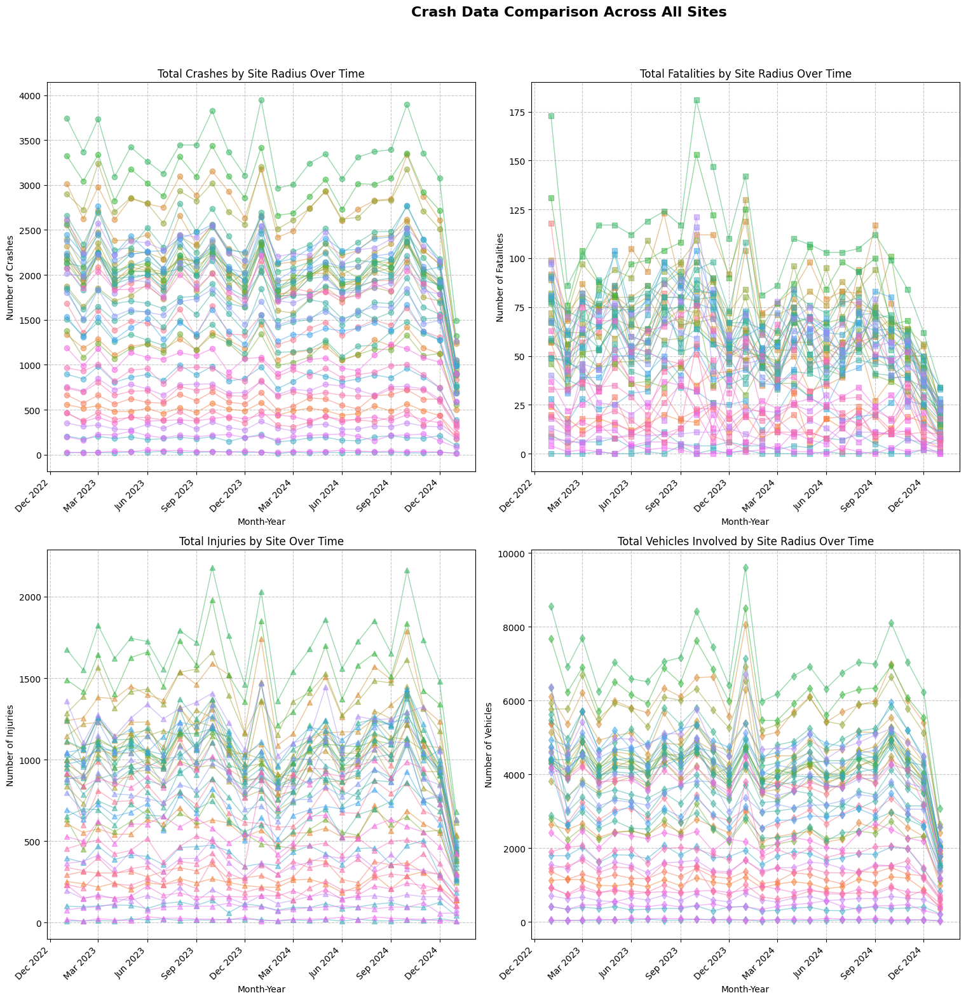

In [0]:
# Group by ID, Year, and Month (keep monthly granularity)
monthly_data = crash_pdf.groupby(['ID', 'Crash Year', 'Crash Month', 'Date']).agg({
    'total_crashes': 'sum',
    'total_fatalities': 'sum',
    'total_injuries': 'sum',
    'total_vehicles': 'sum',
    'Brand': 'first',  # Keep the brand information
    'Month-Year': 'first'  # Keep the formatted month-year string
}).reset_index()

# Create a figure with a grid layout
fig = plt.figure(figsize=(18, 16))
gs = GridSpec(2, 2, figure=fig)

# Set the figure title
fig.suptitle('Crash Data Comparison Across All Sites', fontsize=16, fontweight='bold', y=0.98)

# Color palette for different sites
site_ids = monthly_data['ID'].unique()
colors = sns.color_palette("husl", len(site_ids))
site_color_map = dict(zip(site_ids, colors))

# 1. Total Crashes Plot
ax1 = fig.add_subplot(gs[0, 0])
for site_id in site_ids:
    site_data = monthly_data[monthly_data['ID'] == site_id].sort_values('Date')
    ax1.plot(site_data['Date'], site_data['total_crashes'], 'o-', 
                alpha = 0.5, 
                label=f"Site {site_id}", color=site_color_map[site_id], linewidth=1)

ax1.set_title('Total Crashes by Site Radius Over Time')
ax1.set_xlabel('Month-Year')
ax1.set_ylabel('Number of Crashes')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.legend('', frameon=False)

# Format the x-axis to show month and year
ax1.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%b %Y'))
# Rotate date labels for better readability
plt.setp(ax1.get_xticklabels(), rotation=45, ha='right')
# Show fewer x-tick labels to avoid overcrowding
ax1.xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator(interval=3))

# 2. Total Fatalities Plot
ax2 = fig.add_subplot(gs[0, 1])
for site_id in site_ids:
    site_data = monthly_data[monthly_data['ID'] == site_id].sort_values('Date')
    ax2.plot(site_data['Date'], site_data['total_fatalities'], 's-', 
              alpha = 0.5,
                label=f"Site {site_id}", color=site_color_map[site_id], linewidth=1)

ax2.set_title('Total Fatalities by Site Radius Over Time')
ax2.set_xlabel('Month-Year')
ax2.set_ylabel('Number of Fatalities')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.legend('', frameon=False)

# Format the x-axis to show month and year
ax2.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%b %Y'))
# Rotate date labels for better readability
plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')
# Show fewer x-tick labels to avoid overcrowding
ax2.xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator(interval=3))

# 3. Total Injuries Plot
ax3 = fig.add_subplot(gs[1, 0])
for site_id in site_ids:
    site_data = monthly_data[monthly_data['ID'] == site_id].sort_values('Date')
    ax3.plot(site_data['Date'], site_data['total_injuries'], '^-', 
             alpha = 0.5, 
                label=f"Site {site_id}", color=site_color_map[site_id], linewidth=1)

ax3.set_title('Total Injuries by Site Over Time')
ax3.set_xlabel('Month-Year')
ax3.set_ylabel('Number of Injuries')
ax3.grid(True, linestyle='--', alpha=0.7)
ax3.legend('', frameon=False)

# Format the x-axis to show month and year
ax3.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%b %Y'))
# Rotate date labels for better readability
plt.setp(ax3.get_xticklabels(), rotation=45, ha='right')
# Show fewer x-tick labels to avoid overcrowding
ax3.xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator(interval=3))

# 4. Total Vehicles Plot
ax4 = fig.add_subplot(gs[1, 1])
for site_id in site_ids:
    site_data = monthly_data[monthly_data['ID'] == site_id].sort_values('Date')
    ax4.plot(site_data['Date'], site_data['total_vehicles'], 'd-', 
             alpha = 0.5, 
                label=f"Site {site_id}", color=site_color_map[site_id], linewidth=1)

ax4.set_title('Total Vehicles Involved by Site Radius Over Time')
ax4.set_xlabel('Month-Year')
ax4.set_ylabel('Number of Vehicles')
ax4.grid(True, linestyle='--', alpha=0.7)
ax4.legend('', frameon=False)

# Format the x-axis to show month and year
ax4.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%b %Y'))
# Rotate date labels for better readability
plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')
# Show fewer x-tick labels to avoid overcrowding
ax4.xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator(interval=3))

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 1, 0.95])

# Show the main plots
plt.figure(fig.number)
plt.tight_layout(rect=[0, 0, 0.85, 0.95])
plt.show()

Port A Bowl Restroom Co, located in Plumsteadville, Pennsylvania tends to have the highest number of crashes in the zip codes that intersect with its 40 mile radius. The number of crashes in this range would represent approximately 47-130 crashes per day across the entire area, which is plausible given thata 40-mile radius around Plumsteadville would encompass parts of the Philadelphia metropolitan area, including dense suburban communities and several major highways.  This area likely includes hundreds of thousands of daily commuters and millions of residents and the area contains a mix of urban, suburban, and rural roads with varying safety profiles. 

<Figure size 1200x800 with 0 Axes>

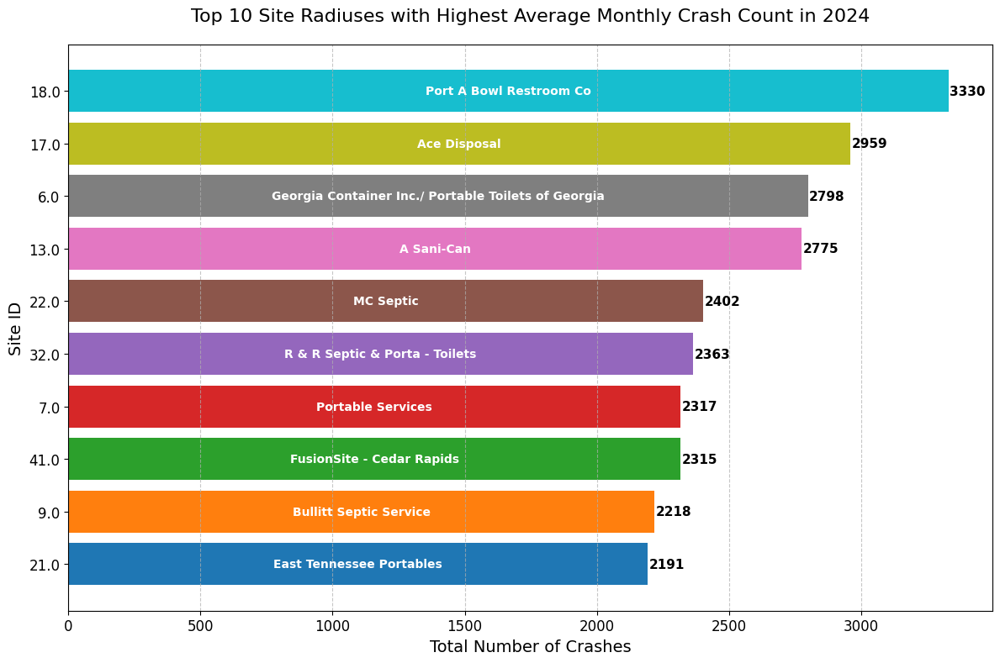

In [0]:
data_2024 = crash_pdf[crash_pdf['Crash Year'] == 2024]

# Aggregate crash data by site
site_crashes = data_2024.groupby('ID').agg({
    'total_crashes': 'mean',
    'Brand': 'first'  # Keep the brand information
}).reset_index()

# Get the top 10 sites by crash count
top_10_sites = site_crashes.sort_values('total_crashes', ascending=True).tail(10)

# Make sure IDs are strings for better display
top_10_sites['ID'] = top_10_sites['ID'].astype(str)

# Create a new column combining ID and Brand for y-axis
top_10_sites['ID_Brand'] = top_10_sites['ID']

# Set up the figure
plt.figure(figsize=(12, 8))

# Create a color palette based on brand
brands = top_10_sites['Brand'].unique()
brand_colors = sns.color_palette("tab10", len(brands))
brand_color_map = dict(zip(brands, brand_colors))

# Create the horizontal bar chart with manual coloring
fig, ax = plt.subplots(figsize=(12, 8))

# Plot bars in ascending order
bars = ax.barh(
    y=top_10_sites['ID_Brand'],
    width=top_10_sites['total_crashes'],
    color=[brand_color_map[brand] for brand in top_10_sites['Brand']]
)

# Enhance the plot with additional information
plt.title('Top 10 Site Radiuses with Highest Average Monthly Crash Count in 2024', fontsize=16, pad=20)
plt.ylabel('Site ID', fontsize=14)
plt.xlabel('Total Number of Crashes', fontsize=14)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)

# Add value labels and brand names inside each bar
for i, (bar, row) in enumerate(zip(bars, top_10_sites.itertuples())):
    # Add crash count at right end of bar
    ax.text(
        bar.get_width() + 5,  # Position just outside the right end of the bar
        bar.get_y() + bar.get_height()/2,  # Vertically centered
        f'{int(bar.get_width())}',
        ha='left', 
        va='center',
        fontsize=11,
        fontweight='bold'
    )
    
    # Add brand name inside the bar
    if bar.get_width() > 30:  # Only add text if bar is wide enough
        ax.text(
            bar.get_width()/2,  # Middle of the bar
            bar.get_y() + bar.get_height()/2,  # Vertically centered
            f"{row.Brand}",
            ha='center',
            va='center',
            fontsize=10,
            fontweight='bold',
            color='white'  # White text for better visibility
        )

# Update y-tick labels to show only site IDs (since brand is inside the bar)
plt.yticks(range(len(top_10_sites)), top_10_sites['ID'])

# Add grid lines for better readability
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Adjust layout
plt.tight_layout()

plt.show()

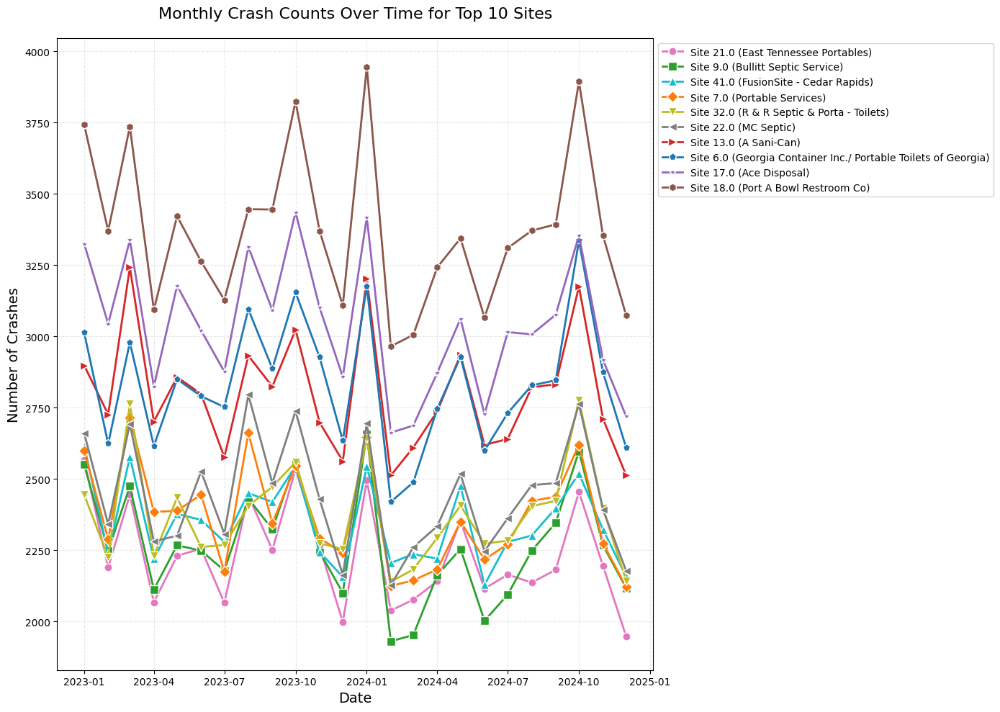

In [0]:
top_site_ids = top_10_sites['ID'].astype(float).tolist()
top_sites_data = crash_pdf[(crash_pdf['ID'].isin(top_site_ids)) & (crash_pdf['Crash Year'] < 2025)]
# Group by site ID and date to get monthly trend
monthly_trends = top_sites_data.groupby(['ID', 'Date']).agg({
    'total_crashes': 'sum',
    'Brand': 'first'
}).reset_index()

# Create a new figure
plt.figure(figsize=(14, 10))

# Create a color palette based on brand
brands = monthly_trends['Brand'].unique()
brand_colors = sns.color_palette("tab10", len(brands))
brand_color_map = dict(zip(brands, brand_colors))

# Create a marker map for sites
markers = ['o', 's', '^', 'D', 'v', '<', '>', 'p', '*', 'h']
site_marker_map = dict(zip(top_site_ids, markers[:len(top_site_ids)]))

# Set up the line plot with custom styling
for site in top_site_ids:
    site_data = monthly_trends[monthly_trends['ID'] == site].sort_values('Date')
    
    if len(site_data) > 0:  # Make sure there's data to plot
        brand = site_data['Brand'].iloc[0]
        
        # Plot the line with both site-specific marker and brand-specific color
        plt.plot(
            site_data['Date'], 
            site_data['total_crashes'],
            marker=site_marker_map[site],
            linestyle='-',
            linewidth=2,
            markersize=8,
            markeredgecolor='white',
            markeredgewidth=1,
            color=brand_color_map[brand],
            label=f"Site {site} ({brand})"
        )
# Enhance the plot appearance
plt.title('Monthly Crash Counts Over Time for Top 10 Sites', fontsize=16, pad=20)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Crashes', fontsize=14)

# Add grid for easier reading
plt.grid(True, linestyle='--', alpha=0.3)

# Create a legend with two columns for better space usage
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1)


plt.tight_layout()
plt.show()

## Precipitation Data 

In [0]:
# Read in precipitation data 
daily_precipitation_df = spark.read.parquet("/FileStore/intermediate_output/site_daily_radius_precipitation_stats")

In [0]:
from pyspark.sql import Window
from pyspark.sql.functions import col, lag, coalesce, lit, expr, when, to_date, date_sub, concat

**Date Adjustment**: Shifts dates backward by one day to correctly align with how PRISM (a climate dataset) defines its measurement periods.
* PRISM defines a "day" as the 24-hour period ending at 12:00 UTC so we calculates exact UTC start and end timestamps for each precipitation measurement period creating both UTC and Eastern Time versions of the timestamps. 
* to_timestamp converts date strings to timestamp objects
* from_utc_timestamp converts UTC times to Eastern Time

**Moving Average Calculation:**
* For each precipitation metric (mean, median, standard deviation, etc.) and or different lookback periods (1, 2, and 3 days), we 
  * Create lag columns to access previous days' values
  * Calculate averages while properly handling null values
  * Uses window function partitioned by site ID to make sure calculations only use data from the same location

In [0]:
display(daily_precipitation_df.groupby("date").count())

date,count
2023-07-15,47
2025-02-16,47
2024-09-18,47
2023-06-22,47
2024-06-04,47
2024-05-30,47
2023-05-22,47
2023-11-08,47
2024-02-05,47
2024-06-12,47


In [0]:
display(daily_precipitation_df.limit(10))

ID,date,mean_precipitation,median_precipitation,stddev_precipitation,q3_precipitation,q1_precipitation,min_precipitation,max_precipitation,iqr_precipitation
1.0,2023-12-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.0,2023-12-23,0.31338480314316486,0.002099999925121665,0.5630426035478447,0.3472999930381775,0.0,0.0,2.2869999408721924,0.3472999930381775
1.0,2024-01-11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.0,2025-01-18,0.47156581233102307,0.44589999318122864,0.4223037940009846,0.5760999917984009,0.24729999899864197,0.0,2.613600015640259,0.3287999927997589
10.0,2023-01-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10.0,2023-07-29,0.7318073322291158,0.0,1.8592068943517568,0.36789998412132263,0.0,0.0,10.069999694824219,0.36789998412132263
10.0,2023-10-10,0.24771028956370977,0.0,0.48877811926271425,0.30469998717308044,0.0,0.0,2.156100034713745,0.30469998717308044
10.0,2023-11-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10.0,2024-01-19,4.991517533274258,4.868899822235107,1.0790349298679556,5.9019999504089355,4.166899681091309,2.561199903488159,8.095799446105957,1.735100269317627
10.0,2024-09-22,2.3081146331045175,0.7202000021934509,3.961643306453269,2.219899892807007,0.1768999993801117,0.0,18.513198852539062,2.042999893426895


In [0]:
daily_precipitation_df.count()

38023

In [0]:
from pyspark.sql.functions import col, to_timestamp, from_utc_timestamp, to_utc_timestamp

daily_precipitation_df = daily_precipitation_df.withColumn(
    "adjusted_date", date_sub(col("date"), 1)
)
# Now add the UTC time boundaries for the PRISM data period
# PRISM defines a "day" as the 24 hours ending at 12:00 GMT (UTC)
# So for a given date, the period is from 12:00 UTC the previous day to 12:00 UTC on the date

# Add the end time (12:00 UTC on the original PRISM date)
daily_precipitation_df = daily_precipitation_df.withColumn(
    "period_end_utc", to_timestamp(concat(col("date").cast("string"), lit(" 12:00:00")), "yyyy-MM-dd HH:mm:ss")
)

# Add the start time (12:00 UTC on the previous day)
daily_precipitation_df = daily_precipitation_df.withColumn(
    "period_start_utc", date_sub(col("period_end_utc"), 1)
)

# Add a column for the "collection day" in various timezones
# This might be useful for joining with other datasets
daily_precipitation_df = daily_precipitation_df.withColumn(
    "collection_date_utc", col("date")
)

# Cache
daily_precipitation_df.cache()

site_window = Window.partitionBy("ID").orderBy("collection_date_utc")

# List of precipitation metrics to create moving averages for
metrics = [
    "mean_precipitation", "median_precipitation", "stddev_precipitation",
    "q3_precipitation", "q1_precipitation", "min_precipitation", 
    "max_precipitation", "iqr_precipitation"
]

# Create moving averages for periods 
for window_size in [1, 2, 3]:
    for metric in metrics:
        # Initialize the dataframe for this iteration
        df_with_ma = daily_precipitation_df
        
        # Sum of previous days only (not including current day)
        sum_expr = lit(0)  # Start with zero
        count_expr = lit(0)  # Count of valid previous values
        
        # Add lag columns for the previous days, using adjusted_date for the window
        for i in range(1, window_size + 1):
            lag_col_name = f"{metric}_lag_{i}"
            df_with_ma = df_with_ma.withColumn(
                lag_col_name, lag(col(metric), i).over(site_window)
            )
            # Add to sum if not null
            sum_expr = sum_expr + coalesce(col(lag_col_name), lit(0))
            # Increment count if not null
            count_expr = count_expr + coalesce(
                col(lag_col_name).isNotNull().cast("int"), 
                lit(0)
            )
        
        # Calculate the moving average, avoiding division by zero
        df_with_ma = df_with_ma.withColumn(
            f"{metric}_prev_{window_size}d_avg", 
            when(count_expr > 0, sum_expr / count_expr).otherwise(None)
        )
        
        # Drop temporary lag columns
        for i in range(1, window_size + 1):
            df_with_ma = df_with_ma.drop(f"{metric}_lag_{i}")
        
        daily_precipitation_df = df_with_ma

In [0]:
daily_precipitation_df.cache()

DataFrame[ID: string, date: date, mean_precipitation: double, median_precipitation: double, stddev_precipitation: double, q3_precipitation: double, q1_precipitation: double, min_precipitation: double, max_precipitation: double, iqr_precipitation: double, adjusted_date: date, period_end_utc: timestamp, period_start_utc: date, collection_date_utc: date, mean_precipitation_prev_1d_avg: double, median_precipitation_prev_1d_avg: double, stddev_precipitation_prev_1d_avg: double, q3_precipitation_prev_1d_avg: double, q1_precipitation_prev_1d_avg: double, min_precipitation_prev_1d_avg: double, max_precipitation_prev_1d_avg: double, iqr_precipitation_prev_1d_avg: double, mean_precipitation_prev_2d_avg: double, median_precipitation_prev_2d_avg: double, stddev_precipitation_prev_2d_avg: double, q3_precipitation_prev_2d_avg: double, q1_precipitation_prev_2d_avg: double, min_precipitation_prev_2d_avg: double, max_precipitation_prev_2d_avg: double, iqr_precipitation_prev_2d_avg: double, mean_precipi

In [0]:
# 37214
daily_precipitation_df.count()

38023

In [0]:
from pyspark.sql.functions import *
from pyspark.sql import Row
from datetime import timedelta

**Date Standardization:**
* The crash data gets a standardized "first day of month" date column to facilitate joining
* This transforms year and month integers into an actual date (e.g., 2023, 5 → 2023-05-01)

**Complete Date Coverage Creation:**
* A complete sequence of dates is generated from the minimum to maximum dates in the precipitation data
* All site IDs are combined with all dates through a cross join, ensuring that every site has every possible date to create a "complete calendar" to handle missing dates in either dataset

**Joining Process:**
* First join: Site-date combinations are joined with precipitation data (left join to preserve all dates)
* Second join: The result is joined with monthly crash data based on site ID and first day of month. This approach links daily precipitation measurements with their corresponding monthly crash statistics

**Column Selection and Window Functions:**
* Window functions are used to handle aggregation properly across the join boundaries
* Crash data (which is monthly) is distributed to all days in the month through first() window functions

**FIPS Code Processing:**
* The county FIPS code is split into state FIPS (first 2 digits) and county code (last 3 digits) and then converted to a numeric value
* The county code is formatted as a 3-digit string with leading zeros
* State IDs are converted to lowercase


**Timezone Extraction:**
* A distinct list of zip codes and their corresponding timezones is created
* The "zips" column (which appears to contain space-separated zip codes) is split and exploded
* This transforms multiple zip codes in a single row into individual rows
* Each zip code is trimmed to remove any extra spaces


**Site Data Joining:**
* The site data is joined with the zip code-timezone mapping based on matching zip codes
* A left join preserves all site records even if a matching zip code isn't found

In [0]:
# read site data f"/FileStore/tables/fusionsite_regional_df.csv")
site_data_df = spark.read.csv("/FileStore/tables/fusionsite_regional_df.csv", header=True)

# Rename State3 to State and State26 to State_ID
site_data_df = site_data_df.withColumnRenamed("State3", "State") 
site_data_df = site_data_df.withColumnRenamed("State26", "State_ID")

site_data_df = site_data_df.withColumnRenamed("City4", "City") 
site_data_df = site_data_df.withColumnRenamed("City25", "Full_City_Name")

site_data_df = site_data_df.filter(site_data_df["Zip"].isNotNull()) \
    .select("ID", "Brand", "Region", "State", "City", "Address",
            "Latitude", "Longitude", "County", "Zip", "Country")

site_data_df = site_data_df.withColumn("Zip", format_string("%05d", col("Zip").cast("int")))

In [0]:
# Double check no Zip values are missing
site_data_df.filter(site_data_df["Zip"].isNull()).count()

0

In [0]:
# Step 1: First ensure we have proper timezone information for all sites
# Read the second CSV file
us_city_states = spark.read.csv("/FileStore/tables/uscities.csv", header=True)

# Extract first two digits of county fips for state fips and last 3 for county code
us_city_states = us_city_states \
    .withColumn("state_fips", substring(col("county_fips"), 1, 2)) \
    .withColumn("county_code", substring(col("county_fips"), -3, 3))

# Convert county_code to numeric, handle errors, fill nulls, and format as 3-digit string
us_city_states = us_city_states \
    .withColumn("county_code", col("county_code").cast("double")) \
    .withColumn("county_code", when(col("county_code").isNull(), 0).otherwise(col("county_code"))) \
    .withColumn("county_code", lpad(col("county_code").cast("int").cast("string"), 3, "0")) \
    .withColumn("state_id", lower(col("state_id")))

zip_timezone_df = us_city_states.select("zips", "timezone").distinct()
zip_timezone_df = zip_timezone_df.withColumn("zip", explode(split(col("zips"), " "))) \
                              .withColumn("zip", trim(col("zip"))) \
                              .select("zip", "timezone")

In [0]:
site_df_timezone = site_data_df.join(
    zip_timezone_df,
    (site_data_df["Zip"] == zip_timezone_df["zip"]),
    "left"
).drop(zip_timezone_df["zip"])

# Fill null timezone with "America/Chicago"
site_df_timezone = site_df_timezone.fillna("America/Chicago", subset=["timezone"])

In [0]:
site_df_timezone.cache()

DataFrame[ID: string, Brand: string, Region: string, State: string, City: string, Address: string, Latitude: string, Longitude: string, County: string, Zip: string, Country: string, timezone: string]

In [0]:
display(site_df_timezone)

ID,Brand,Region,State,City,Address,Latitude,Longitude,County,Zip,Country,timezone
1.0,Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago
10.0,Blue Moon Restrooms,North,Kentucky,Nicholasville,109 Means Dr Nicholasville KY 40356,37.941486,-84.55274,Jessamine County,40356,US,America/New_York
11.0,Gotta Go Site Service Rentals,Gulf South,Mississippi,Jackson,120 US 49 N Jackson MS 39209,32.488432,-90.292417,Madison County,39209,US,America/Chicago
12.0,A. John/A1 Portable Toilets,North,New York,Walden,901 Route 52 Walden NY 12586,41.558348,-74.161866,Orange County,12586,US,America/New_York
13.0,A Sani-Can,South Central,North Carolina,Denver,8151 Webbs Rd Denver NC 28037,35.524003,-80.98074,Lincoln County,28037,US,America/New_York
14.0,Griffin Waste,South Central,North Carolina,Asheville,432 Old Leicester Hwy Asheville NC 28806,35.63133,-82.619392,Buncombe County,28806,US,America/New_York
15.0,C&L Sanitation; Safe-Way Barricades,North,Ohio,Perrysburg,27545 Glenwood Rd Perrysburg OH 43551,41.551664,-83.557511,Wood County,43551,US,America/New_York
16.0,Rent-A-John,North,Ohio,Columbus,4522 Lockbourne Rd Columbus OH 43207,39.871202,-82.967868,Franklin County,43207,US,America/New_York
17.0,Ace Disposal,North,Pennsylvania,Malvern,1133 W Valley Hill Rd Malvern PA 19355,40.054339,-75.60434,Chester County,19355,US,America/New_York
18.0,Port A Bowl Restroom Co,North,Pennsylvania,Plumsteadville,5519 Old Easton Rd Plumsteadville PA 18949,40.38123,-75.145335,Bucks County,18949,US,America/New_York


In [0]:
# Delete duplicates in site_df_timezone using ID column
site_df_timezone = site_df_timezone.dropDuplicates(['ID'])

In [0]:
site_df_timezone.count()
# Drop duplicates

47

In [0]:
# Count number of unique ID values
daily_precipitation_df.select("ID").distinct().count()

47

In [0]:
precip_with_tz = daily_precipitation_df.join(
    site_df_timezone,
    daily_precipitation_df["ID"] == site_df_timezone["ID"],
    "left"
).drop(site_df_timezone["ID"])

In [0]:
precip_with_tz.cache()

DataFrame[ID: string, date: date, mean_precipitation: double, median_precipitation: double, stddev_precipitation: double, q3_precipitation: double, q1_precipitation: double, min_precipitation: double, max_precipitation: double, iqr_precipitation: double, adjusted_date: date, period_end_utc: timestamp, period_start_utc: date, collection_date_utc: date, mean_precipitation_prev_1d_avg: double, median_precipitation_prev_1d_avg: double, stddev_precipitation_prev_1d_avg: double, q3_precipitation_prev_1d_avg: double, q1_precipitation_prev_1d_avg: double, min_precipitation_prev_1d_avg: double, max_precipitation_prev_1d_avg: double, iqr_precipitation_prev_1d_avg: double, mean_precipitation_prev_2d_avg: double, median_precipitation_prev_2d_avg: double, stddev_precipitation_prev_2d_avg: double, q3_precipitation_prev_2d_avg: double, q1_precipitation_prev_2d_avg: double, min_precipitation_prev_2d_avg: double, max_precipitation_prev_2d_avg: double, iqr_precipitation_prev_2d_avg: double, mean_precipi

In [0]:
precip_with_tz.count()

38023

In [0]:
# Convert UTC measurement times to site local time
precip_with_tz = precip_with_tz.withColumn(
    "period_end_local", 
    from_utc_timestamp(col("period_end_utc"), col("timezone"))
)
precip_with_tz = precip_with_tz.withColumn(
    "period_start_local", 
    from_utc_timestamp(col("period_start_utc"), col("timezone"))
)

# Add local date columns for joining
precip_with_tz = precip_with_tz.withColumn(
    "local_date", 
    expr("to_date(period_end_local)")
)
precip_with_tz = precip_with_tz.withColumn(
    "local_month_first_day", 
    expr("make_date(year(local_date), month(local_date), 1)")
)

In [0]:
display(precip_with_tz.limit(5))

ID,date,mean_precipitation,median_precipitation,stddev_precipitation,q3_precipitation,q1_precipitation,min_precipitation,max_precipitation,iqr_precipitation,adjusted_date,period_end_utc,period_start_utc,collection_date_utc,mean_precipitation_prev_1d_avg,median_precipitation_prev_1d_avg,stddev_precipitation_prev_1d_avg,q3_precipitation_prev_1d_avg,q1_precipitation_prev_1d_avg,min_precipitation_prev_1d_avg,max_precipitation_prev_1d_avg,iqr_precipitation_prev_1d_avg,mean_precipitation_prev_2d_avg,median_precipitation_prev_2d_avg,stddev_precipitation_prev_2d_avg,q3_precipitation_prev_2d_avg,q1_precipitation_prev_2d_avg,min_precipitation_prev_2d_avg,max_precipitation_prev_2d_avg,iqr_precipitation_prev_2d_avg,mean_precipitation_prev_3d_avg,median_precipitation_prev_3d_avg,stddev_precipitation_prev_3d_avg,q3_precipitation_prev_3d_avg,q1_precipitation_prev_3d_avg,min_precipitation_prev_3d_avg,max_precipitation_prev_3d_avg,iqr_precipitation_prev_3d_avg,Brand,Region,State,City,Address,Latitude,Longitude,County,Zip,Country,timezone,period_end_local,period_start_local,local_date,local_month_first_day
1.0,2023-01-01,0.010229113830041282,0.0,0.062321772317325594,0.0,0.0,0.0,0.42489999532699585,0.0,2022-12-31,2023-01-01T12:00:00Z,2022-12-31,2023-01-01,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-01-01T06:00:00Z,2022-12-30T18:00:00Z,2023-01-01,2023-01-01
1.0,2023-01-02,0.28584176301808817,0.0,1.3346581978409808,0.0,0.0,0.0,10.211899757385254,0.0,2023-01-01,2023-01-02T12:00:00Z,2023-01-01,2023-01-02,0.010229113830041282,0.0,0.062321772317325594,0.0,0.0,0.0,0.42489999532699585,0.0,0.010229113830041282,0.0,0.062321772317325594,0.0,0.0,0.0,0.42489999532699585,0.0,0.010229113830041282,0.0,0.062321772317325594,0.0,0.0,0.0,0.42489999532699585,0.0,Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-01-02T06:00:00Z,2022-12-31T18:00:00Z,2023-01-02,2023-01-01
1.0,2023-01-03,49.59476586836803,49.6078987121582,10.783329813062272,54.97079849243164,41.80799865722656,24.775699615478516,76.2134017944336,13.162799835205078,2023-01-02,2023-01-03T12:00:00Z,2023-01-02,2023-01-03,0.28584176301808817,0.0,1.3346581978409808,0.0,0.0,0.0,10.211899757385254,0.0,0.14803543842406472,0.0,0.6984899850791532,0.0,0.0,0.0,5.318399876356125,0.0,0.14803543842406472,0.0,0.6984899850791532,0.0,0.0,0.0,5.318399876356125,0.0,Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-01-03T06:00:00Z,2023-01-01T18:00:00Z,2023-01-03,2023-01-01
1.0,2023-01-04,0.19780759168847736,0.0,0.3706992557838148,0.34540000557899475,0.0,0.0,1.6205999851226807,0.34540000557899475,2023-01-03,2023-01-04T12:00:00Z,2023-01-03,2023-01-04,49.59476586836803,49.6078987121582,10.783329813062272,54.97079849243164,41.80799865722656,24.775699615478516,76.2134017944336,13.162799835205078,24.94030381569306,24.8039493560791,6.058994005451626,27.48539924621582,20.90399932861328,12.387849807739258,43.212650775909424,6.581399917602539,16.630278915072054,16.535966237386067,4.060103261073526,18.323599497477215,13.935999552408854,8.258566538492838,28.950067182381947,4.387599945068359,Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-01-04T06:00:00Z,2023-01-02T18:00:00Z,2023-01-04,2023-01-01
1.0,2023-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-04,2023-01-05T12:00:00Z,2023-01-04,2023-01-05,0.19780759168847736,0.0,0.3706992557838148,0.34540000557899475,0.0,0.0,1.6205999851226807,0.34540000557899475,24.896286730028255,24.8039493560791,5.577014534

In [0]:
# Step 3: Process crash data with proper time handling
# Add standardized date column to crash data
crash_data_with_date = aggregated_site_radius_crash_df.withColumn(
    "first_day_of_month", 
    expr("make_date(cast(`Crash Year` as int), cast(`Crash Month` as int), 1)")
)

# Step 4: Create complete calendar for all sites
# Get min and max dates from precipitation data
min_date = daily_precipitation_df.agg(min("date")).collect()[0][0]
max_date = daily_precipitation_df.agg(max("date")).collect()[0][0]

# Create a date sequence dataframe
date_sequence = spark.createDataFrame(
    [Row(date=min_date + timedelta(days=i)) for i in range((max_date - min_date).days + 1)],
    ["date"]
)

# Get distinct site IDs
site_ids = daily_precipitation_df.select("ID").distinct()

# Cross join to create all site-date combinations
site_date_combinations = site_ids.crossJoin(date_sequence)

In [0]:
site_date_combinations.printSchema()

root
 |-- ID: string (nullable = true)
 |-- date: date (nullable = true)



In [0]:
site_date_combinations.count()

38023

In [0]:
# Add timezone information to site-date combinations
site_date_with_tz = site_date_combinations.join(
    site_df_timezone,
    site_date_combinations["ID"] == site_df_timezone["ID"],
    "left"
).drop(site_df_timezone["ID"])

# Convert UTC dates to local dates based on site timezone
site_date_with_tz = site_date_with_tz.withColumn(
    "local_date", 
    expr("to_date(from_utc_timestamp(to_timestamp(concat(cast(date as string), ' 12:00:00'), 'yyyy-MM-dd HH:mm:ss'), timezone))")
)

# Extract year and month from local date for joining with crash data
site_date_with_tz = site_date_with_tz.withColumn(
    "year", year("local_date")
).withColumn(
    "month", month("local_date")
).withColumn(
    "local_month_first_day", 
    expr("make_date(year, month, 1)")
)

In [0]:
display(site_date_with_tz.limit(2))

ID,date,Brand,Region,State,City,Address,Latitude,Longitude,County,Zip,Country,timezone,local_date,year,month,local_month_first_day
1.0,2023-01-01,Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-01-01,2023,1,2023-01-01
50.0,2023-01-01,Stamback Services,West,Arizona,Wilcox,1111 E Maley St Willcox AZ 85643,32.243469,-109.818113,Cochise County,85643,US,America/Phoenix,2023-01-01,2023,1,2023-01-01


In [0]:
site_date_with_tz.count()

38023

In [0]:
# Drop these columns from precip_with_tz
# Brand:string
# Region:string
# State:string
# City:string
# Address:string
# Latitude:string
# Longitude:string
# County:string
# Zip:string
# Country:string
# period_end_local:timestamp
# period_start_local:timestamp
# local_date:date
# local_month_first_day:date

columns_to_drop = [
    "Brand", "Region", "State", "City", "Address", "Latitude", 
    "Longitude", "County", "Zip", "Country", "period_end_local", 
    "period_start_local", "local_month_first_day"
]

precip_with_tz = precip_with_tz.drop(*columns_to_drop)

In [0]:
precip_with_tz.count()

38023

In [0]:
site_date_with_tz = site_date_with_tz.drop("date")
site_date_with_tz.printSchema()

root
 |-- ID: string (nullable = true)
 |-- Brand: string (nullable = true)
 |-- Region: string (nullable = true)
 |-- State: string (nullable = true)
 |-- City: string (nullable = true)
 |-- Address: string (nullable = true)
 |-- Latitude: string (nullable = true)
 |-- Longitude: string (nullable = true)
 |-- County: string (nullable = true)
 |-- Zip: string (nullable = true)
 |-- Country: string (nullable = true)
 |-- timezone: string (nullable = true)
 |-- local_date: date (nullable = true)
 |-- year: integer (nullable = true)
 |-- month: integer (nullable = true)
 |-- local_month_first_day: date (nullable = true)



In [0]:
site_date_with_tz.count()

38023

In [0]:
precip_with_tz.cache()

DataFrame[ID: string, date: date, mean_precipitation: double, median_precipitation: double, stddev_precipitation: double, q3_precipitation: double, q1_precipitation: double, min_precipitation: double, max_precipitation: double, iqr_precipitation: double, adjusted_date: date, period_end_utc: timestamp, period_start_utc: date, period_end_eastern: timestamp, period_start_eastern: timestamp, collection_date_utc: date, collection_date_eastern: date, mean_precipitation_prev_1d_avg: double, median_precipitation_prev_1d_avg: double, stddev_precipitation_prev_1d_avg: double, q3_precipitation_prev_1d_avg: double, q1_precipitation_prev_1d_avg: double, min_precipitation_prev_1d_avg: double, max_precipitation_prev_1d_avg: double, iqr_precipitation_prev_1d_avg: double, mean_precipitation_prev_2d_avg: double, median_precipitation_prev_2d_avg: double, stddev_precipitation_prev_2d_avg: double, q3_precipitation_prev_2d_avg: double, q1_precipitation_prev_2d_avg: double, min_precipitation_prev_2d_avg: dou

In [0]:
# Step 5: Join everything together with timezone awareness
# First join precipitation data to the site-date combinations
daily_with_precip = site_date_with_tz.join(
    precip_with_tz.drop("timezone"),  # Drop duplicate timezone column
    (site_date_with_tz["ID"] == precip_with_tz["ID"]) & 
    (site_date_with_tz["local_date"] == precip_with_tz["local_date"]),
    "left"
).drop(precip_with_tz["ID"]).drop(precip_with_tz["local_date"]).drop(precip_with_tz["date"])

In [0]:
crash_data_with_date.count()

1150

In [0]:
daily_with_precip.count()

38023

In [0]:
# Then join with monthly crash data using local date's month
daily_with_crash_data = daily_with_precip.join(
    crash_data_with_date,
    (daily_with_precip["ID"] == crash_data_with_date["ID"]) & 
    (daily_with_precip["local_month_first_day"] == crash_data_with_date["first_day_of_month"]),
    "left"
).drop(crash_data_with_date["ID"]).drop(crash_data_with_date["Brand"])

In [0]:
daily_with_crash_data.cache()

DataFrame[Brand: string, Region: string, State: string, City: string, Address: string, Latitude: string, Longitude: string, County: string, Zip: string, Country: string, timezone: string, local_date: date, year: int, month: int, local_month_first_day: date, ID: string, date: date, mean_precipitation: double, median_precipitation: double, stddev_precipitation: double, q3_precipitation: double, q1_precipitation: double, min_precipitation: double, max_precipitation: double, iqr_precipitation: double, adjusted_date: date, period_end_utc: timestamp, period_start_utc: date, collection_date_utc: date, mean_precipitation_prev_1d_avg: double, median_precipitation_prev_1d_avg: double, stddev_precipitation_prev_1d_avg: double, q3_precipitation_prev_1d_avg: double, q1_precipitation_prev_1d_avg: double, min_precipitation_prev_1d_avg: double, max_precipitation_prev_1d_avg: double, iqr_precipitation_prev_1d_avg: double, mean_precipitation_prev_2d_avg: double, median_precipitation_prev_2d_avg: double,

In [0]:
daily_with_crash_data.count()

38023

In [0]:
display(daily_with_crash_data.limit(10))

Brand,Region,State,City,Address,Latitude,Longitude,County,Zip,Country,timezone,local_date,year,month,local_month_first_day,ID,date,mean_precipitation,median_precipitation,stddev_precipitation,q3_precipitation,q1_precipitation,min_precipitation,max_precipitation,iqr_precipitation,adjusted_date,period_end_utc,period_start_utc,period_end_eastern,period_start_eastern,collection_date_utc,collection_date_eastern,mean_precipitation_prev_1d_avg,median_precipitation_prev_1d_avg,stddev_precipitation_prev_1d_avg,q3_precipitation_prev_1d_avg,q1_precipitation_prev_1d_avg,min_precipitation_prev_1d_avg,max_precipitation_prev_1d_avg,iqr_precipitation_prev_1d_avg,mean_precipitation_prev_2d_avg,median_precipitation_prev_2d_avg,stddev_precipitation_prev_2d_avg,q3_precipitation_prev_2d_avg,q1_precipitation_prev_2d_avg,min_precipitation_prev_2d_avg,max_precipitation_prev_2d_avg,iqr_precipitation_prev_2d_avg,mean_precipitation_prev_3d_avg,median_precipitation_prev_3d_avg,stddev_precipitation_prev_3d_avg,q3_precipitation_prev_3d_avg,q1_precipitation_prev_3d_avg,min_precipitation_prev_3d_avg,max_precipitation_prev_3d_avg,iqr_precipitation_prev_3d_avg,ID,Brand,Crash Year,Crash Month,total_crashes,total_fatalities,total_injuries,total_vehicles,year_month,total_crashes_prev_1m_avg,total_crashes_prev_2m_avg,total_crashes_prev_3m_avg,total_crashes_prev_4m_avg,total_crashes_prev_5m_avg,total_crashes_prev_6m_avg,total_fatalities_prev_1m_avg,total_fatalities_prev_2m_avg,total_fatalities_prev_3m_avg,total_fatalities_prev_4m_avg,total_fatalities_prev_5m_avg,total_fatalities_prev_6m_avg,total_injuries_prev_1m_avg,total_injuries_prev_2m_avg,total_injuries_prev_3m_avg,total_injuries_prev_4m_avg,total_injuries_prev_5m_avg,total_injuries_prev_6m_avg,total_vehicles_prev_1m_avg,total_vehicles_prev_2m_avg,total_vehicles_prev_3m_avg,total_vehicles_prev_4m_avg,total_vehicles_prev_5m_avg,total_vehicles_prev_6m_avg,first_day_of_month
Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-06-02,2023,6,2023-06-01,1.0,2023-06-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-06-01,2023-06-02T12:00:00Z,2023-06-01,2023-06-02T08:00:00Z,2023-05-31T20:00:00Z,2023-06-02,2023-06-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Arkansas Portable Toilets,2023,6,1461.0,54.0,844.0,3082.0,2023-06-01,1483.0,1435.0,1491.3333333333333,1457.5,1502.0,1502.0,44.0,38.0,40.666666666666664,40.75,42.8,42.8,748.0,745.0,766.6666666666666,725.0,762.8,762.8,3043.0,2904.5,3018.0,2932.75,3219.8,3219.8,2023-06-01
Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-06-20,2023,6,2023-06-01,1.0,2023-06-20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-06-19,2023-06-20T12:00:00Z,2023-06-19,2023-06-20T08:00:00Z,2023-06-18T20:00:00Z,2023-06-20,2023-06-20,3.790212545968309,4.014499664306641,1.767737400990906,5.053899765014648,2.849599838256836,0.3472999930381775,7.730599880218506,2.2042999267578125,13.46569707687897,11.80935001373291,7.142480588432455,16.30869960784912,8.319599628448486,5.055350035429001,35.79634928703308,7.989099979400635,9.514357529782968,8.104000012079874,5.540118421479181,11.6480663617452,5.565766418973605,3.3702333569526672,28.142966111501057,6.082299942771594,1.0,Arkansas Portable Toilets,2023,6,1461.0,54.0,844.0,3082.0,2023-06-01,1483.0,1435.0,1491.3333333333333,1457.5,1502.0,1502.0,44.0,38.0,40.666666666666664,40.75,42.8,42.8,748.0,745.0,766.6666666666666,725.0,762.8,762.8,3043.0,2904.5,3018.0,2932.75,3219.8,3219.8,2023-06-01
Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-07-11,2023,7,2023-07-01,1.0,2023-07-11,0.14323290754728538,0.0,0.5869757170437766,0.0,0.0,0.0,3.1183998584747314,0.0,2023-07-10,2023-07-11T

In [0]:
# Verify the final dataset has unique ID-date combinations
final_id_date_counts = daily_with_crash_data.groupBy("ID", "local_date").count()
final_duplicates = final_id_date_counts.filter(col("count") > 1)


In [0]:
display(final_duplicates)

ID,local_date,count


In [0]:
# Check that each ID has the same number of rows
final_id_counts = final_id_date_counts.groupBy("ID").count()

In [0]:
display(final_id_counts)

ID,count
1.0,809
50.0,809
22.0,809
15.0,809
45.0,809
47.0,809
44.0,809
25.0,809
26.0,809
17.0,809


In [0]:
display(daily_with_crash_data)

Brand,Region,State,City,Address,Latitude,Longitude,County,Zip,Country,timezone,local_date,year,month,local_month_first_day,ID,date,mean_precipitation,median_precipitation,stddev_precipitation,q3_precipitation,q1_precipitation,min_precipitation,max_precipitation,iqr_precipitation,adjusted_date,period_end_utc,period_start_utc,collection_date_utc,mean_precipitation_prev_1d_avg,median_precipitation_prev_1d_avg,stddev_precipitation_prev_1d_avg,q3_precipitation_prev_1d_avg,q1_precipitation_prev_1d_avg,min_precipitation_prev_1d_avg,max_precipitation_prev_1d_avg,iqr_precipitation_prev_1d_avg,mean_precipitation_prev_2d_avg,median_precipitation_prev_2d_avg,stddev_precipitation_prev_2d_avg,q3_precipitation_prev_2d_avg,q1_precipitation_prev_2d_avg,min_precipitation_prev_2d_avg,max_precipitation_prev_2d_avg,iqr_precipitation_prev_2d_avg,mean_precipitation_prev_3d_avg,median_precipitation_prev_3d_avg,stddev_precipitation_prev_3d_avg,q3_precipitation_prev_3d_avg,q1_precipitation_prev_3d_avg,min_precipitation_prev_3d_avg,max_precipitation_prev_3d_avg,iqr_precipitation_prev_3d_avg,Crash Year,Crash Month,total_crashes,total_fatalities,total_injuries,total_vehicles,year_month,total_crashes_prev_1m_avg,total_crashes_prev_2m_avg,total_crashes_prev_3m_avg,total_crashes_prev_4m_avg,total_crashes_prev_5m_avg,total_crashes_prev_6m_avg,total_fatalities_prev_1m_avg,total_fatalities_prev_2m_avg,total_fatalities_prev_3m_avg,total_fatalities_prev_4m_avg,total_fatalities_prev_5m_avg,total_fatalities_prev_6m_avg,total_injuries_prev_1m_avg,total_injuries_prev_2m_avg,total_injuries_prev_3m_avg,total_injuries_prev_4m_avg,total_injuries_prev_5m_avg,total_injuries_prev_6m_avg,total_vehicles_prev_1m_avg,total_vehicles_prev_2m_avg,total_vehicles_prev_3m_avg,total_vehicles_prev_4m_avg,total_vehicles_prev_5m_avg,total_vehicles_prev_6m_avg,first_day_of_month
Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-01-01,2023,1,2023-01-01,1.0,2023-01-01,0.010229113830041282,0.0,0.062321772317325594,0.0,0.0,0.0,0.42489999532699585,0.0,2022-12-31,2023-01-01T12:00:00Z,2022-12-31,2023-01-01,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2023,1,1680.0,51.0,914.0,4368.0,2023-01-01,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2023-01-01
Stamback Services,West,Arizona,Wilcox,1111 E Maley St Willcox AZ 85643,32.243469,-109.818113,Cochise County,85643,US,America/Phoenix,2023-01-01,2023,1,2023-01-01,50.0,2023-01-01,0.9809999766114813,0.006199999712407589,1.3696097439819543,1.9584999084472656,0.0,0.0,3.478799819946289,1.9584999084472656,2022-12-31,2023-01-01T12:00:00Z,2022-12-31,2023-01-01,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2023,1,739.0,19.0,338.0,1461.0,2023-01-01,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2023-01-01
MC Septic,South Central,Tennessee,Greeneville,250 State St Greeneville TN 37743,36.173656,-82.856456,Greene County,37743,US,America/New_York,2023-01-01,2023,1,2023-01-01,22.0,2023-01-01,8.047090387827641,8.361000061035156,4.991149427397332,13.0339994430542,3.492499828338623,0.4959999918937683,14.770299911499023,9.541499614715576,2022-12-31,2023-01-01T12:00:00Z,2022-12-31,2023-01-01,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2023,1,2660.0,79.0,1114.0,5468.0,2023-01-01,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2023-01-01
C&L Sanitation; Safe-Way Barricades,North,Ohio,Perrysburg,27545 Glenwood Rd Perrysburg OH 43551,41.551664,-83.557511,Wood County,43551,US,America/New_York,2023-01-01,2023,1,2023-01-01,15

In [0]:
# Read in /FileStore/tables/zipcode_tripdate.csv
zipcode_tripdate = spark.read.csv("/FileStore/tables/zipcode_tripdate.csv", header=True, inferSchema=True)

In [0]:
daily_with_crash_data.printSchema()

root
 |-- Brand: string (nullable = true)
 |-- Region: string (nullable = true)
 |-- State: string (nullable = true)
 |-- City: string (nullable = true)
 |-- Address: string (nullable = true)
 |-- Latitude: string (nullable = true)
 |-- Longitude: string (nullable = true)
 |-- County: string (nullable = true)
 |-- Zip: string (nullable = true)
 |-- Country: string (nullable = true)
 |-- timezone: string (nullable = true)
 |-- local_date: date (nullable = true)
 |-- year: integer (nullable = true)
 |-- month: integer (nullable = true)
 |-- local_month_first_day: date (nullable = true)
 |-- ID: string (nullable = true)
 |-- date: date (nullable = true)
 |-- mean_precipitation: double (nullable = true)
 |-- median_precipitation: double (nullable = true)
 |-- stddev_precipitation: double (nullable = true)
 |-- q3_precipitation: double (nullable = true)
 |-- q1_precipitation: double (nullable = true)
 |-- min_precipitation: double (nullable = true)
 |-- max_precipitation: double (nullable =

In [0]:
# Check which rows in zipcode_tripdate (zipcode, trip_date) are in daily_with_crash_data (Zip, local_date)
zipcode_tripdate_in_daily = zipcode_tripdate.join(
    daily_with_crash_data,
    (zipcode_tripdate["zipcode"] == daily_with_crash_data["Zip"]) & 
    (zipcode_tripdate["trip_date"] == daily_with_crash_data["local_date"]),
    "inner"
    )

In [0]:
# Check which rows in zipcode_tripdate (zipcode, trip_date) are not in daily_with_crash_data (Zip, local_date
zipcode_tripdate_not_in_daily = zipcode_tripdate.join(
    daily_with_crash_data,
    (zipcode_tripdate["zipcode"] == daily_with_crash_data["Zip"]) & 
    (zipcode_tripdate["trip_date"] == daily_with_crash_data["local_date"]),
    "left_anti"
    )

In [0]:
display(zipcode_tripdate_not_in_daily)

zipcode,trip_date


In [0]:
zipcode_tripdate_in_daily.count()

10000

In [0]:
# Save site_daily_data to csv in /FileStore/intermediate_output/
daily_with_crash_data.write.mode("overwrite").csv('/FileStore/intermediate_output/site_daily_data_with_crash_and_precipitation', header=True)

In [0]:
# Manually downloaded from display UI
display(daily_with_crash_data)

Brand,Region,State,City,Address,Latitude,Longitude,County,Zip,Country,timezone,local_date,year,month,local_month_first_day,ID,date,mean_precipitation,median_precipitation,stddev_precipitation,q3_precipitation,q1_precipitation,min_precipitation,max_precipitation,iqr_precipitation,adjusted_date,period_end_utc,period_start_utc,period_end_eastern,period_start_eastern,collection_date_utc,collection_date_eastern,mean_precipitation_prev_1d_avg,median_precipitation_prev_1d_avg,stddev_precipitation_prev_1d_avg,q3_precipitation_prev_1d_avg,q1_precipitation_prev_1d_avg,min_precipitation_prev_1d_avg,max_precipitation_prev_1d_avg,iqr_precipitation_prev_1d_avg,mean_precipitation_prev_2d_avg,median_precipitation_prev_2d_avg,stddev_precipitation_prev_2d_avg,q3_precipitation_prev_2d_avg,q1_precipitation_prev_2d_avg,min_precipitation_prev_2d_avg,max_precipitation_prev_2d_avg,iqr_precipitation_prev_2d_avg,mean_precipitation_prev_3d_avg,median_precipitation_prev_3d_avg,stddev_precipitation_prev_3d_avg,q3_precipitation_prev_3d_avg,q1_precipitation_prev_3d_avg,min_precipitation_prev_3d_avg,max_precipitation_prev_3d_avg,iqr_precipitation_prev_3d_avg,Crash Year,Crash Month,total_crashes,total_fatalities,total_injuries,total_vehicles,year_month,total_crashes_prev_1m_avg,total_crashes_prev_2m_avg,total_crashes_prev_3m_avg,total_crashes_prev_4m_avg,total_crashes_prev_5m_avg,total_crashes_prev_6m_avg,total_fatalities_prev_1m_avg,total_fatalities_prev_2m_avg,total_fatalities_prev_3m_avg,total_fatalities_prev_4m_avg,total_fatalities_prev_5m_avg,total_fatalities_prev_6m_avg,total_injuries_prev_1m_avg,total_injuries_prev_2m_avg,total_injuries_prev_3m_avg,total_injuries_prev_4m_avg,total_injuries_prev_5m_avg,total_injuries_prev_6m_avg,total_vehicles_prev_1m_avg,total_vehicles_prev_2m_avg,total_vehicles_prev_3m_avg,total_vehicles_prev_4m_avg,total_vehicles_prev_5m_avg,total_vehicles_prev_6m_avg,first_day_of_month
Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-06-02,2023,6,2023-06-01,1.0,2023-06-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-06-01,2023-06-02T12:00:00Z,2023-06-01,2023-06-02T08:00:00Z,2023-05-31T20:00:00Z,2023-06-02,2023-06-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023,6,1461.0,54.0,844.0,3082.0,2023-06-01,1483.0,1435.0,1491.3333333333333,1457.5,1502.0,1502.0,44.0,38.0,40.666666666666664,40.75,42.8,42.8,748.0,745.0,766.6666666666666,725.0,762.8,762.8,3043.0,2904.5,3018.0,2932.75,3219.8,3219.8,2023-06-01
Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-06-20,2023,6,2023-06-01,1.0,2023-06-20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-06-19,2023-06-20T12:00:00Z,2023-06-19,2023-06-20T08:00:00Z,2023-06-18T20:00:00Z,2023-06-20,2023-06-20,3.790212545968309,4.014499664306641,1.767737400990906,5.053899765014648,2.849599838256836,0.3472999930381775,7.730599880218506,2.2042999267578125,13.46569707687897,11.80935001373291,7.142480588432455,16.30869960784912,8.319599628448486,5.055350035429001,35.79634928703308,7.989099979400635,9.514357529782968,8.104000012079874,5.540118421479181,11.6480663617452,5.565766418973605,3.3702333569526672,28.142966111501057,6.082299942771594,2023,6,1461.0,54.0,844.0,3082.0,2023-06-01,1483.0,1435.0,1491.3333333333333,1457.5,1502.0,1502.0,44.0,38.0,40.666666666666664,40.75,42.8,42.8,748.0,745.0,766.6666666666666,725.0,762.8,762.8,3043.0,2904.5,3018.0,2932.75,3219.8,3219.8,2023-06-01
Arkansas Portable Toilets,Gulf South,Arkansas,Little Rock,924 W 15th St. N Little Rock Arkansas 72114,34.768452,-92.277291,Pulaski County,72114,US,America/Chicago,2023-07-11,2023,7,2023-07-01,1.0,2023-07-11,0.14323290754728538,0.0,0.5869757170437766,0.0,0.0,0.0,3.1183998584747314,0.0,2023-07-10,2023-07-11T12:00:00Z,2023-07-10,2023-07-11T08:00:00Z,2023-07-09T20:00:00Z,2023-0